# Environment

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%%bash
pip install .

Processing /Users/dwynne891/Documents/Options/optionlib
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Created wheel for optionlib: filename=optionlib-0.1.0-py3-none-any.whl size=38265 sha256=0cd4e0af73cf61adbf4746749a2e766f32eb01278948e73c7a766fdc084cfb0f
  Stored in directory: /private/var/folders/5p/b_k1m3qs09q0s_768gjrmvvh0000gp/T/pip-ephem-wheel-cache-ia4hu2wx/wheels/4d/62/1f/11cc5573a52206189c39d7fffa7bb24e2fafc7df16a30a71e1
Successfully built optionlib
  Attempting uninstall: optionlib
    Found existing installation: optionlib 0.1.0
    Uninstalling optionlib-0.1.0:
      Successfully uninstalled optionlib-0.1.0


In [14]:
optionlib

<module 'optionlib' from '/Users/dwynne891/Documents/Options/optionlib/optionlib/__init__.py'>

In [181]:
from optionlib import floating_quantile, menus, options
from optionlib.data import prices

In [29]:
from plotly import express as px
import pandas as pd
import numpy as np
from tqdm import tqdm
from sklearn.ensemble import GradientBoostingRegressor
from joblib import Parallel, delayed
from scipy.stats import norm
from IPython.display import clear_output
import datetime

# Data
SPX: %5ESPX

In [ ]:
spx_prices = pd.read_parquet('../historical_data/spx_price_history.parquet').sort_index()

spx_iv_hist = pd.read_parquet(
    '../historical_data/iv_timeseries_trading_days.parquet'
)

In [ ]:
prices_df = prices.fidelity_option_prices()

## Inputs

In [230]:
asset_price = 5000.62
DTE = 3

# IV quintile

In [272]:
ATM_strike = prices_df.index.get_level_values('Strike')[
    prices_df.reset_index().Strike.add(-asset_price).abs().idxmin()
]

IV = prices_df.loc[pd.IndexSlice[:,ATM_strike],:].IV.mean()

In [273]:
floating_quintile = floating_quantile.floating_quantile(
    dte=DTE,
    iv = IV,
    y = spx_prices,
    iv_hist = spx_iv_hist,
    time=datetime.time(16,15)
)

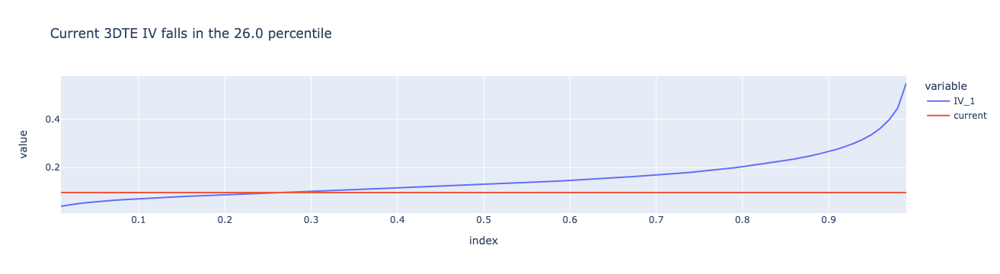

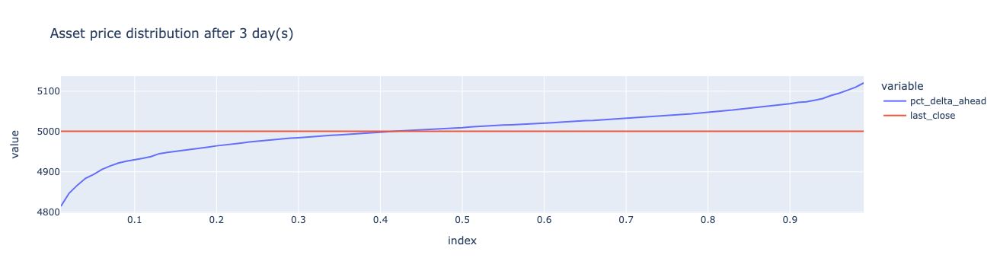

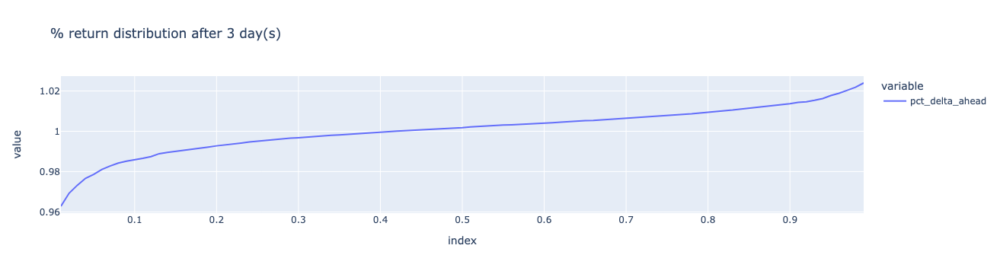

In [274]:
IV_ptiles = spx_iv_hist.IV_1.quantile(
        [round(i,2) for i in np.linspace(0.01,.99,99)]
).to_frame()

IV_ptile_current = (IV_ptiles - IV).abs().idxmin().values[0]

px.line(
    IV_ptiles.assign(current = IV),
    title = f'Current {DTE}DTE IV falls in the {round(IV_ptile_current*100,0)} percentile'
).show()

px.line(
    floating_quintile.add(1).multiply(asset_price).to_frame().assign(last_close = asset_price),
    title = f'Asset price distribution after {DTE} day(s)'
).show()

px.line(
    floating_quintile.add(1).to_frame(),
    title = f'% return distribution after {DTE} day(s)'
).show()

# Trade menu

## Tabu search

In [249]:
%%time

bounds = tuple(round(i) for i in floating_quintile.agg(['min','max']).add(1).multiply(asset_price))
print(bounds)

menu_tabu = menus.TradeMenu(
    prices_df,
    asset_price,
    floating_quintile,
    bounds = bounds,
    midpoint_price = False
)

tabu_strikes, tabu_list = menu_tabu.iron_condors_search(
    max_iterations = 10,
    initial_sample = 1000,
    win_pct_skew = 0.00
)

(4815, 5121)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 430 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 780 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:    2.7s finished


[46, 1, 6, 0] 1.011487569114747
[24, 52, 6, 0] 1.025714510127329
[24, 1, 1, 0] 1.0216268390653747
Local maximum after 0 iterations
CPU times: user 5.2 s, sys: 93.3 ms, total: 5.29 s
Wall time: 5.24 s


In [256]:
tabu_strikes

[4930.0, 4995.0, 5025.0, 5120.0]

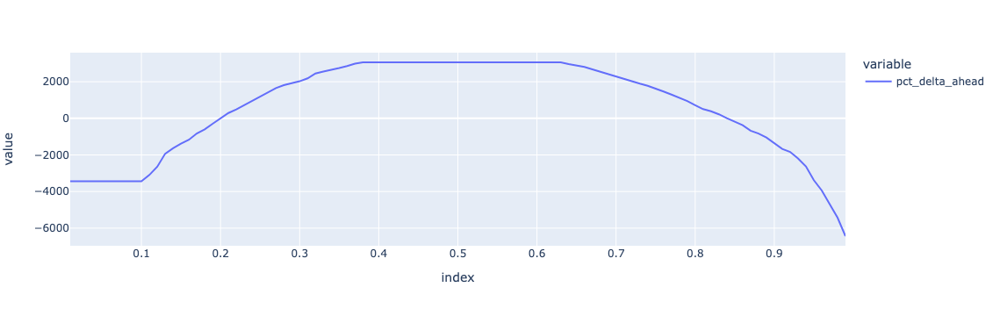

In [251]:
opt = options.OptionChain([
                menu_tabu.options['puts']['buy'][tabu_strikes[0]],
                menu_tabu.options['puts']['write'][tabu_strikes[1]],
                menu_tabu.options['calls']['write'][tabu_strikes[2]],
                menu_tabu.options['calls']['buy'][tabu_strikes[3]],
            ])

px.line(opt.payout)

In [257]:
print(f'''Tabu optimum details:
Strikes:      {tabu_strikes}
Geometric EV: {round(opt.EV_harmonic*100,4)}
Win percent:  {round(opt.win_pct*100,2)}
Cost:         {round(opt.price,2)}
Kelly:        {opt.kelly}
'''
    
)

Tabu optimum details:
Strikes:      [4930.0, 4995.0, 5025.0, 5120.0]
Geometric EV: 102.6405
Win percent:  65.66
Cost:         -30.65
Kelly:        0.55



## Exhaustive/sampling

In [239]:
max_combos = 10_000

bounds = tuple(round(i) for i in floating_quintile.agg(['min','max']).add(1).multiply(asset_price))
print(bounds)

menu = menus.TradeMenu(
    prices_df,
    asset_price,
    floating_quintile,
    bounds = bounds,
    midpoint_price = False
)

menu.iron_condors(
        downsample = max_combos,
        win_pct_bounds = (0,0.99)
)

(4815, 5121)
355,845 combinations detected, randomly downsampling to 10,000 combinations
Calculating 10000 Iron Condors...


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 430 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 780 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 1230 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 1780 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 2430 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 3180 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done 4030 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done 4980 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done 6030 tasks      | elapsed:   16.9s
[Parallel(n_jobs=-1)]: Done 7180 tasks      | elapsed:   20.0s
[Parallel(n_jobs=-1)]: Done 8430 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done 9780 tasks      | elapsed:   27.3s
[Parallel(n_jobs=-1)]: Done 10000 out of

### Visualization

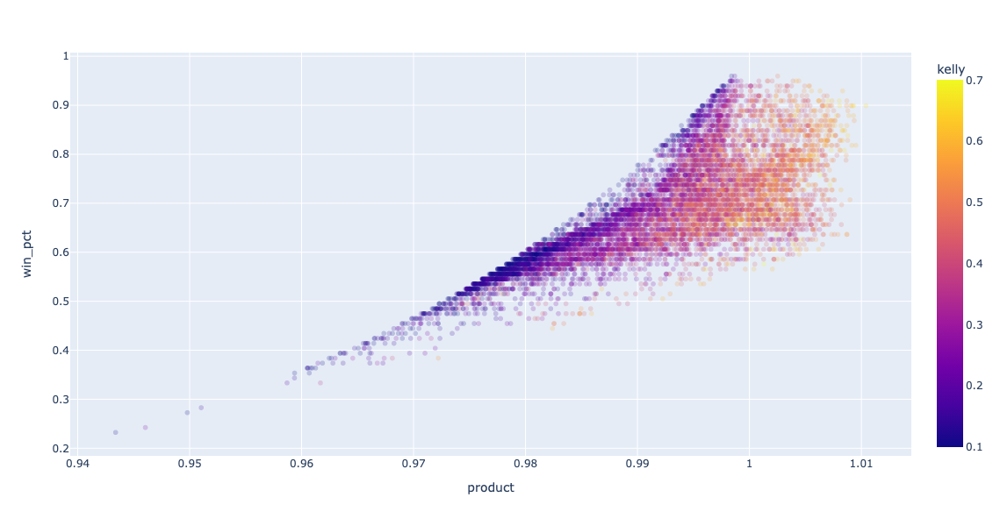

In [243]:
win_pct_skew = 0.04

px.scatter(
    data_frame = menu.menu.assign(product = lambda x: x.EV_harmonic * (x.win_pct**win_pct_skew)).reset_index(),
    x = 'product',
    y = 'win_pct',
    hover_data = ['leg_1','leg_2','leg_3','leg_4'],
    opacity = 0.2,
    height = 600,
    color = 'kelly'
)

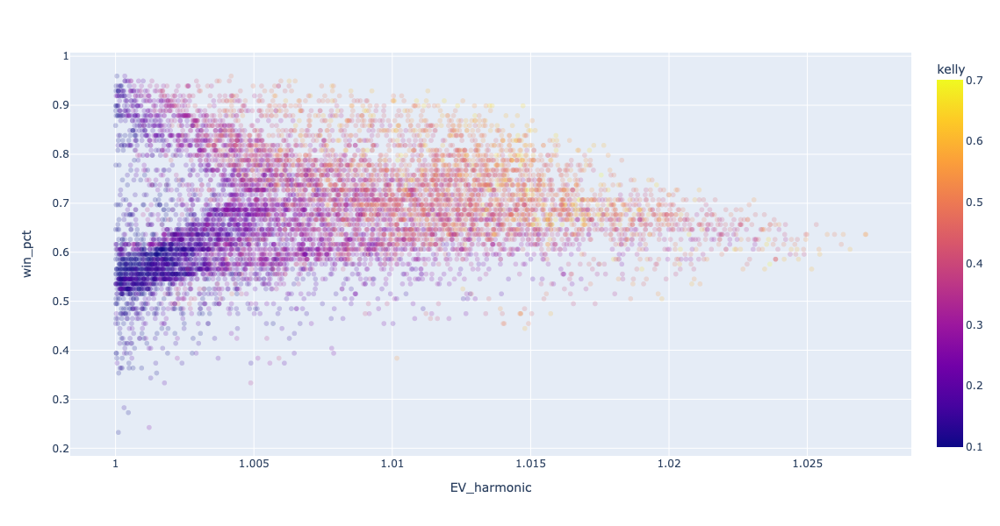

In [253]:
px.scatter(
    data_frame = menu.menu.loc['Iron condor'].reset_index(),#.sample(30000),
    x = 'EV_harmonic',
    y = 'win_pct',
    hover_data = ['leg_1','leg_2','leg_3','leg_4'],
    opacity = 0.2,
    height = 600,
    color = 'kelly'
)

In [ ]:
4890, 5010, 5065, 5130

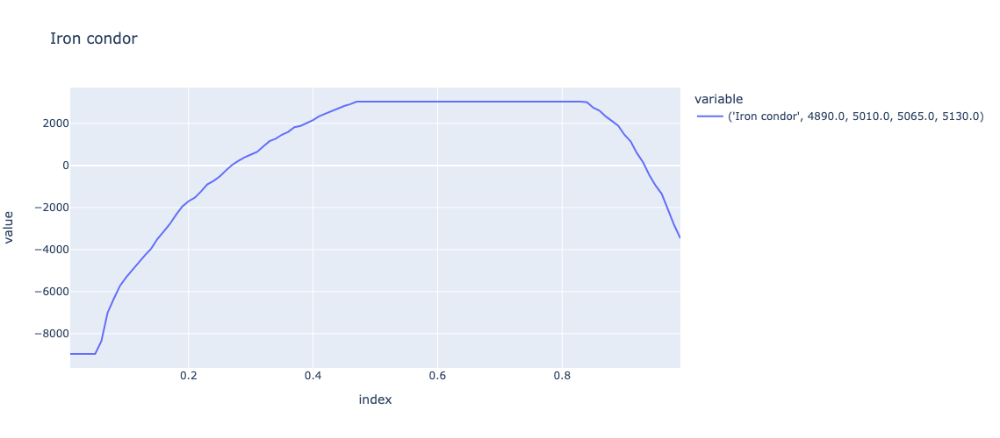

In [229]:
strategy = 'Iron condor'
val1, val2, val3, val4 =4890, 5010, 5065, 5130
menu_slice = menu.menu_quantiles.loc[pd.IndexSlice[strategy,val1,:,val3,val4],:].T

menu_slice.columns = [str(i) for i in menu_slice.columns.to_flat_index()]

px.line(menu_slice,height = 500,title = strategy)

In [559]:
menu.menu.loc[pd.IndexSlice[strategy,val1,val2,val3,val4],:]

cost               -44.800000
EV_arithmetic      971.058386
win_pct              0.717172
max_loss        -18522.600000
EV_harmonic          1.014889
kelly                0.650000
Name: (Iron condor, 4735.0, 4965.0, 5050.0, 5055.0), dtype: float64

## Spreads

In [190]:
menu_spreads = menus.TradeMenu(
    prices_df,
    asset_price,
    floating_quintile,
    bounds = bounds,
    midpoint_price = False
)

menu_spreads.spreads()

Calculating bull call spreads ...
Calculating bull put spreads ...
Calculating bear call spreads ...
Calculating bear put spreads ...
Complete


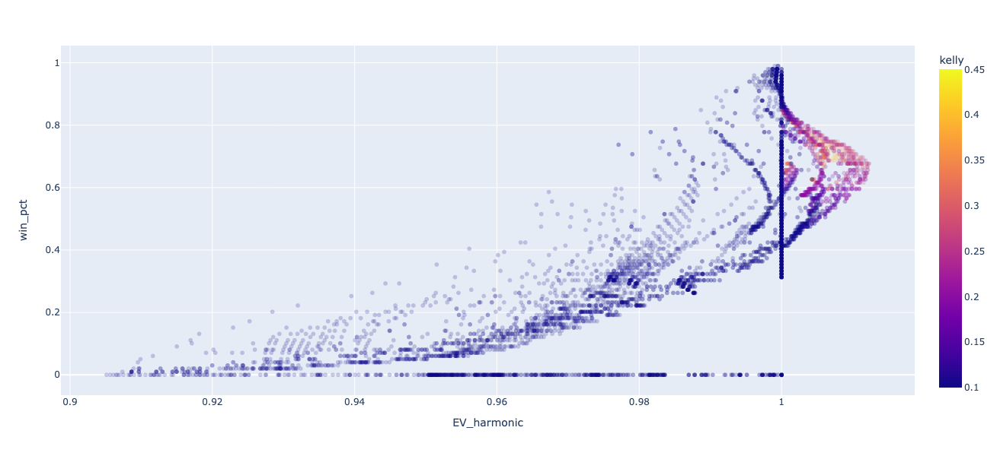

In [191]:
px.scatter(
    data_frame = menu_spreads.menu.reset_index(),#.sample(30000),
    x = 'EV_harmonic',
    y = 'win_pct',
    hover_data = ['strategy','leg_1','leg_2'],
    opacity = 0.2,
    height = 600,
    color = 'kelly'
)

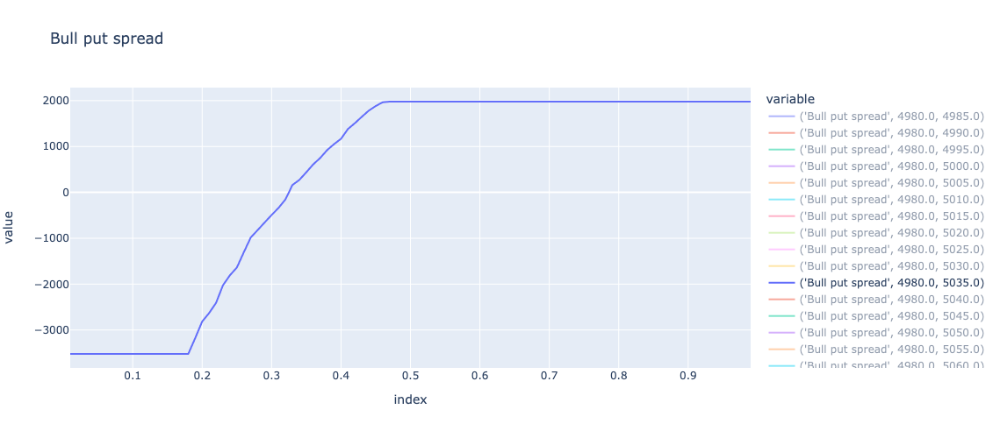

In [192]:
strategy = 'Bull put spread'
val1, val2=4980,5035
menu_slice = menu_spreads.menu_quantiles.loc[pd.IndexSlice[strategy,val1,:],:].T

menu_slice.columns = [str(i) for i in menu_slice.columns.to_flat_index()]

px.line(menu_slice,height = 500,title = strategy)

# Kelly Criterion

## Tabu

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:    5.8s finished


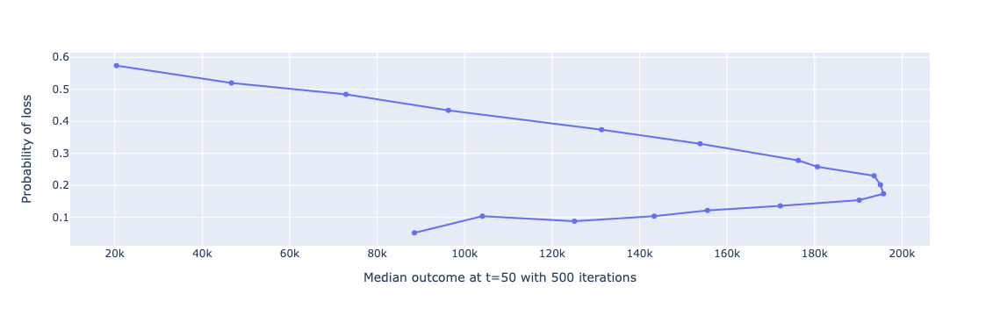

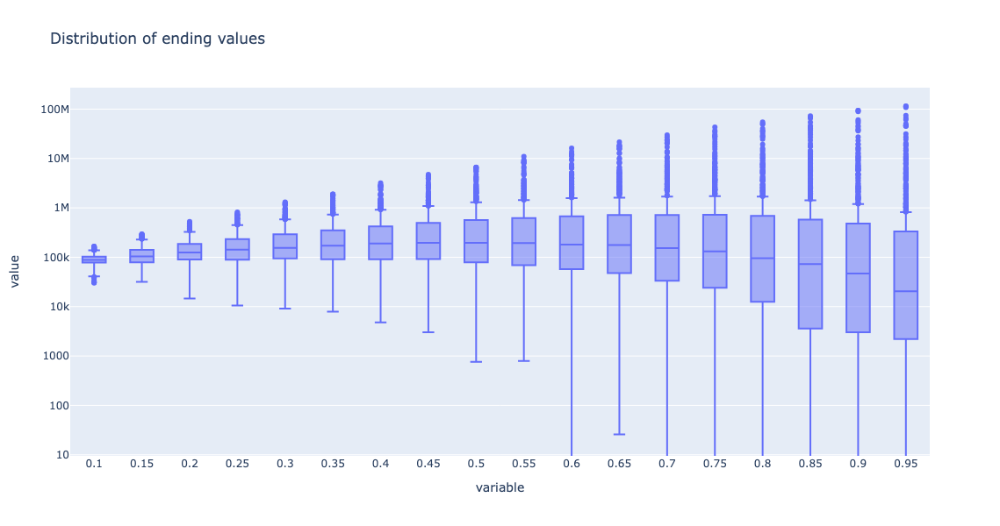

       Contracts  Max_loss  Max_gain
Kelly                               
0.10         0.0      -0.0       0.0
0.15         1.0   -6437.6    3062.4
0.20         1.0   -6437.6    3062.4
0.25         2.0  -12875.2    6124.8
0.30         2.0  -12875.2    6124.8
0.35         3.0  -19312.8    9187.2
0.40         3.0  -19312.8    9187.2
0.45         4.0  -25750.4   12249.6
0.50         4.0  -25750.4   12249.6
0.55         5.0  -32188.0   15312.0
0.60         5.0  -32188.0   15312.0
0.65         6.0  -38625.6   18374.4
0.70         6.0  -38625.6   18374.4
0.75         6.0  -38625.6   18374.4
0.80         7.0  -45063.2   21436.8
0.85         7.0  -45063.2   21436.8
0.90         8.0  -51500.8   24499.2
0.95         8.0  -51500.8   24499.2


In [255]:
strategy = 'Iron condor'

menu_tabu.kelly_criteria(strategy, *tabu_strikes, iterations = 500)

## Exhaustive

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 142 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 430 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:    9.5s finished


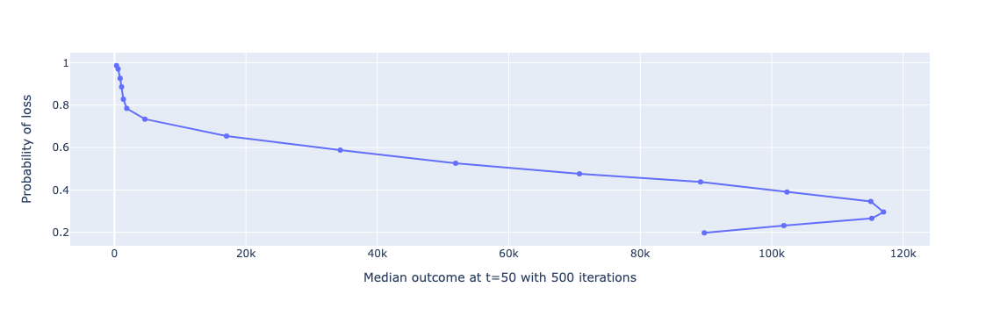

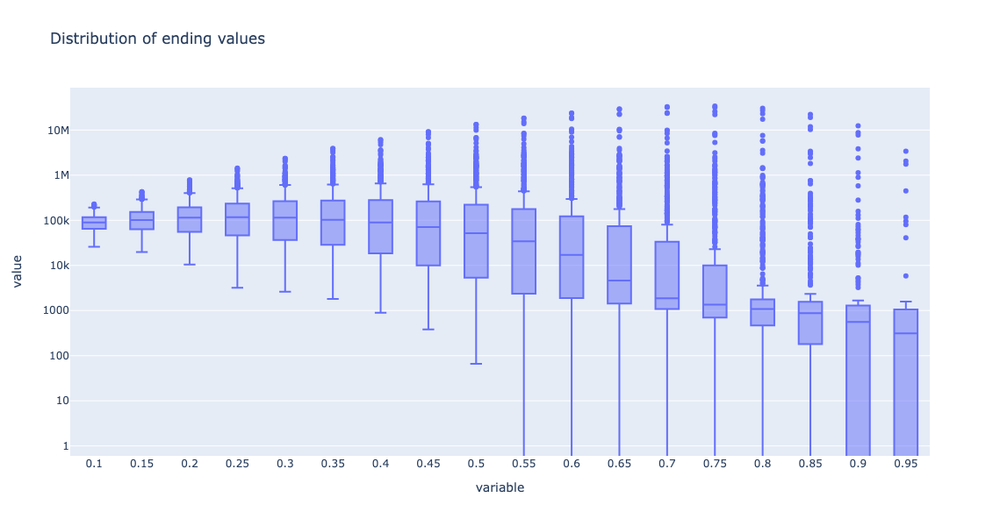

       Contracts  Max_loss  Max_gain
Kelly                               
0.10         1.0   -3017.6    1482.4
0.15         2.0   -6035.2    2964.8
0.20         3.0   -9052.8    4447.2
0.25         4.0  -12070.4    5929.6
0.30         5.0  -15088.0    7412.0
0.35         6.0  -18105.6    8894.4
0.40         7.0  -21123.2   10376.8
0.45         8.0  -24140.8   11859.2
0.50         9.0  -27158.4   13341.6
0.55        10.0  -30176.0   14824.0
0.60        11.0  -33193.6   16306.4
0.65        12.0  -36211.2   17788.8
0.70        13.0  -39228.8   19271.2
0.75        14.0  -42246.4   20753.6
0.80        15.0  -45264.0   22236.0
0.85        16.0  -48281.6   23718.4
0.90        17.0  -51299.2   25200.8
0.95        18.0  -54316.8   26683.2


In [674]:
strategy = 'Iron condor'
val1, val2, val3, val4 =4940,4985,5080,5090

menu.kelly_criteria(strategy, val1, val2, val3, val4,iterations = 500)

# Addenda

### Price target

In [124]:
mod = GradientBoostingRegressor(loss = 'huber')#(loss = 'quantile',alpha = 50/100)

In [141]:
mod.fit(
    model_obj.X,
    model_obj.data.pct_delta_ahead[model_obj.X.index]*100
)

GradientBoostingRegressor(loss='huber')

In [134]:
import shap

In [142]:
explainer = shap.Explainer(mod.predict, model_obj.X.sample(100))
shap_values = explainer(model_obj.X)
shap_values_sample = explainer(model_obj.data.loc['2023-12-15',model_obj.X.columns])

PermutationExplainer explainer: 7408it [04:22, 27.16it/s]                          


In [159]:
model_obj.data.loc['2023-12-11':'2023-12-15',model_obj.X.columns].fillna(0)

,Volume,Volume_7d,pct_delta_1d,pct_delta_2d,pct_delta_3d,pct_delta_4d,pct_delta_5d,pct_delta_6d,pct_delta_7d,pct_delta_30d,pct_delta_60d,pct_delta_90d,pct_delta_180d,pct_delta_360d,hv30,shiller_pe,T10Y2Y,VIX,jobs_friday
Date,,,,,,,,,,,,,,,,,,,
2023-12-11,65002200,7.364650e+07,0.003890,0.008205,0.015898,0.011805,0.011605,0.006295,0.012248,0.124939,0.041997,0.029298,0.167378,0.187665,0.431437,30.97,-0.48,12.63,0.0
2023-12-12,68327600,7.067931e+07,0.004567,0.008475,0.012810,0.020538,0.016426,0.016225,0.010891,0.116726,0.046142,0.038697,0.170521,0.194072,0.408854,30.97,-0.53,12.07,0.0
2023-12-13,93278000,7.365747e+07,0.013790,0.018420,0.022382,0.026777,0.034612,0.030442,0.030239,0.125060,0.062772,0.043909,0.189333,0.224527,0.440984,30.97,-0.42,12.19,0.0
2023-12-14,119026000,8.069069e+07,0.003209,0.017044,0.021689,0.025663,0.030072,0.037932,0.033749,0.116761,0.076076,0.051833,0.176056,0.239424,0.425021,30.97,-0.45,12.48,0.0
2023-12-15,141319300,9.100420e+07,-0.005678,-0.002487,0.011269,0.015888,0.019839,0.024224,0.032039,0.089539,0.087948,0.052900,0.162571,0.238893,0.365930,31.92,-0.53,12.28,0.0


In [160]:
shap_values_sample = explainer(model_obj.data.loc['2023-12-11':'2023-12-15',model_obj.X.columns].fillna(0))

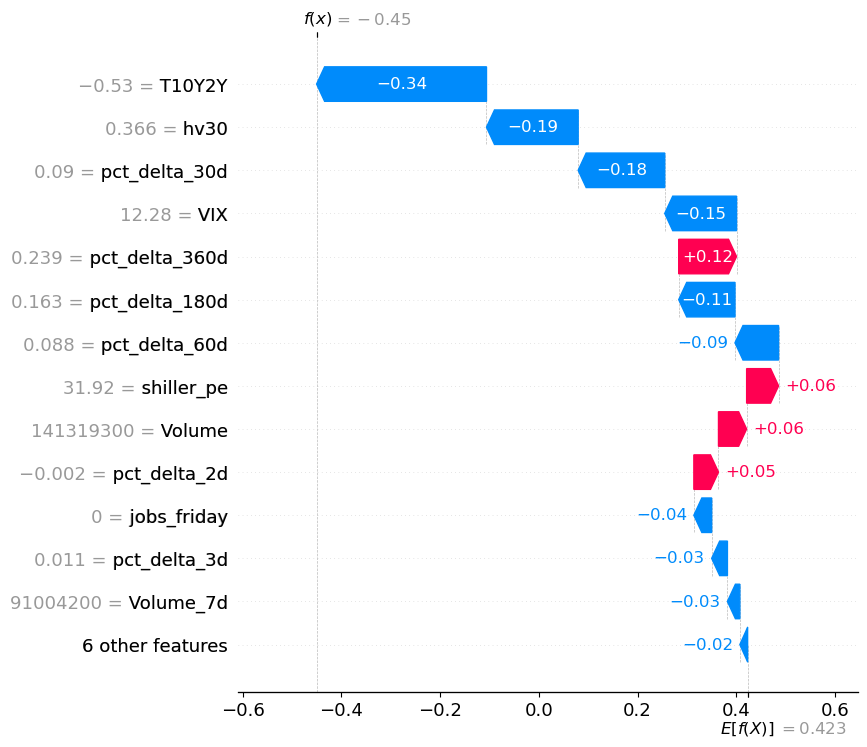

In [163]:
shap.plots.waterfall(shap_values_sample[-1], max_display=14)

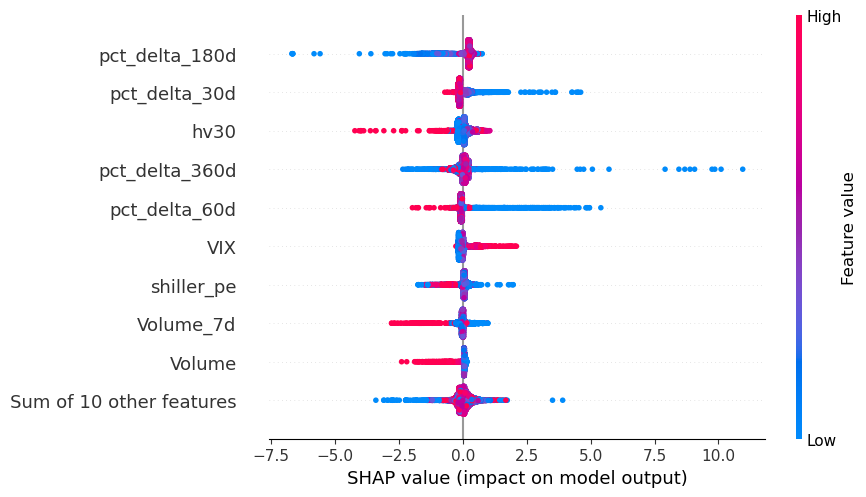

In [166]:
shap.plots.beeswarm(shap_values)

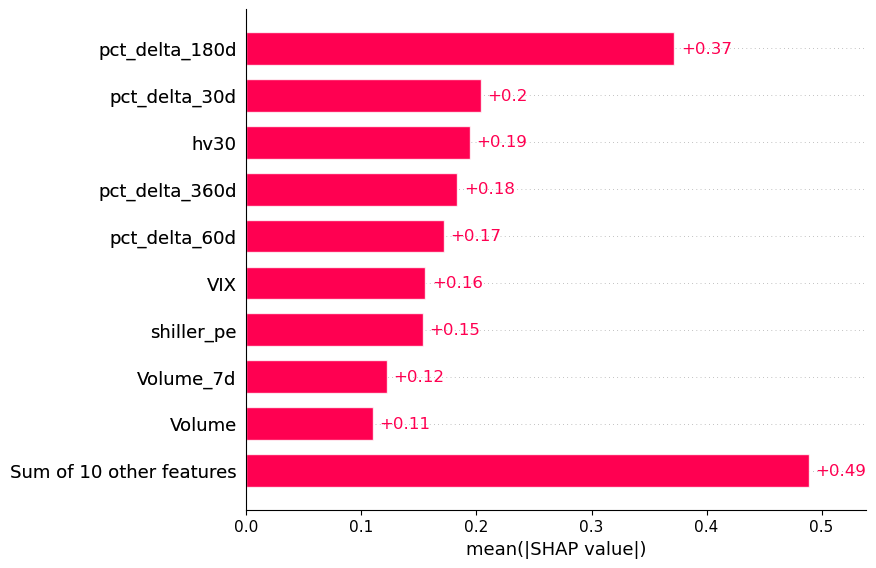

In [167]:
shap.plots.bar(shap_values)

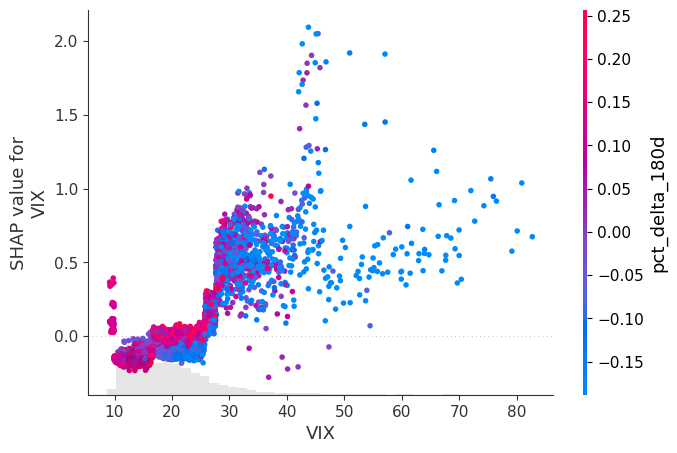

In [168]:
shap.plots.scatter(shap_values[:, "VIX"], color=shap_values)


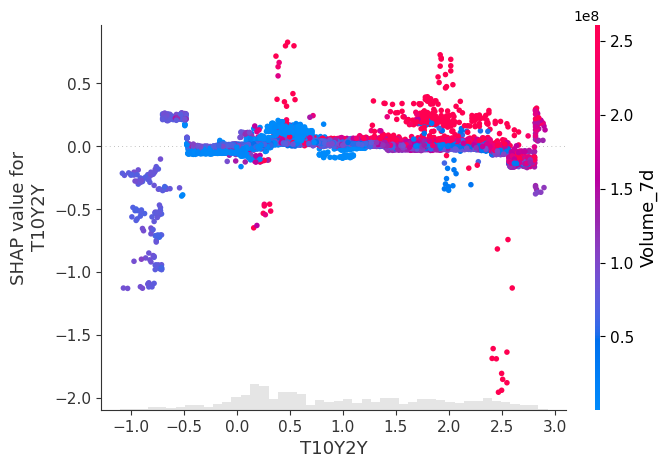

In [169]:
shap.plots.scatter(shap_values[:, "T10Y2Y"], color=shap_values)


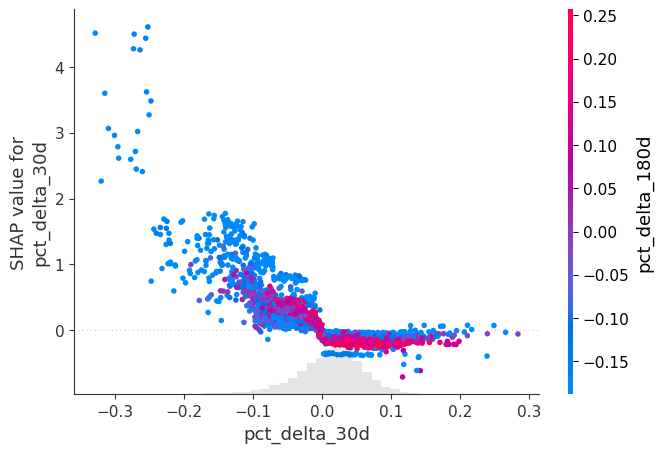

In [170]:
shap.plots.scatter(shap_values[:, "pct_delta_30d"], color=shap_values)


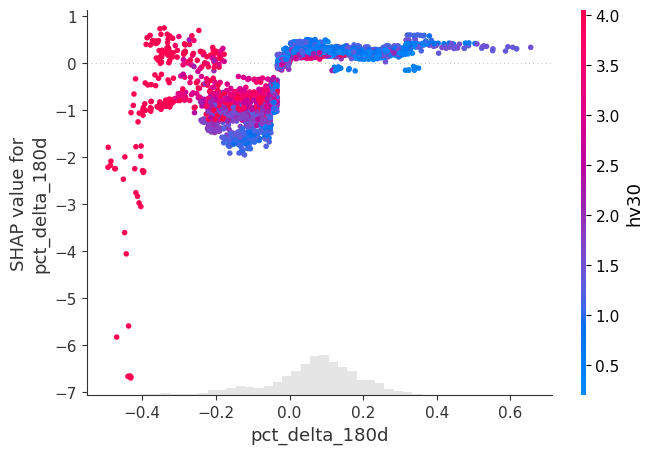

In [171]:
shap.plots.scatter(shap_values[:, "pct_delta_180d"], color=shap_values)


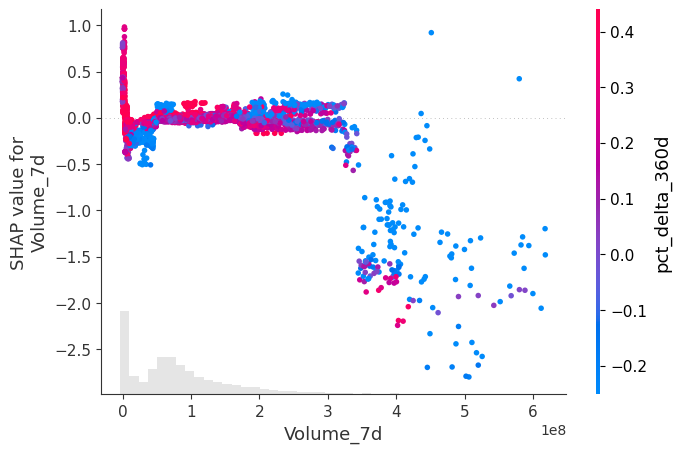

In [174]:
shap.plots.scatter(shap_values[:, "Volume_7d"], color=shap_values)
